In [3]:
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import imageio
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Conv2D, MaxPooling2D,Flatten, Reshape, Dropout, BatchNormalization,LeakyReLU, Conv2DTranspose, ReLU
import numpy as np
import os
from tensorflow.python.client import device_lib
from tensorflow.keras.utils import save_img
#import plotly.express as px
import random
import pandas as pd

In [8]:
# load models
unconditional_gan = keras.models.load_model('models\\traditional_binary_gan_generator.h5')
conditional_gan = keras.models.load_model('models\conditional_gan_generator.h5')
conditional_softmax_gan = keras.models.load_model('models\cond_gan_softmax_generator.h5')
cloth_model_clasifier = keras.models.load_model('models\cloth_with_model_classifier.h5')

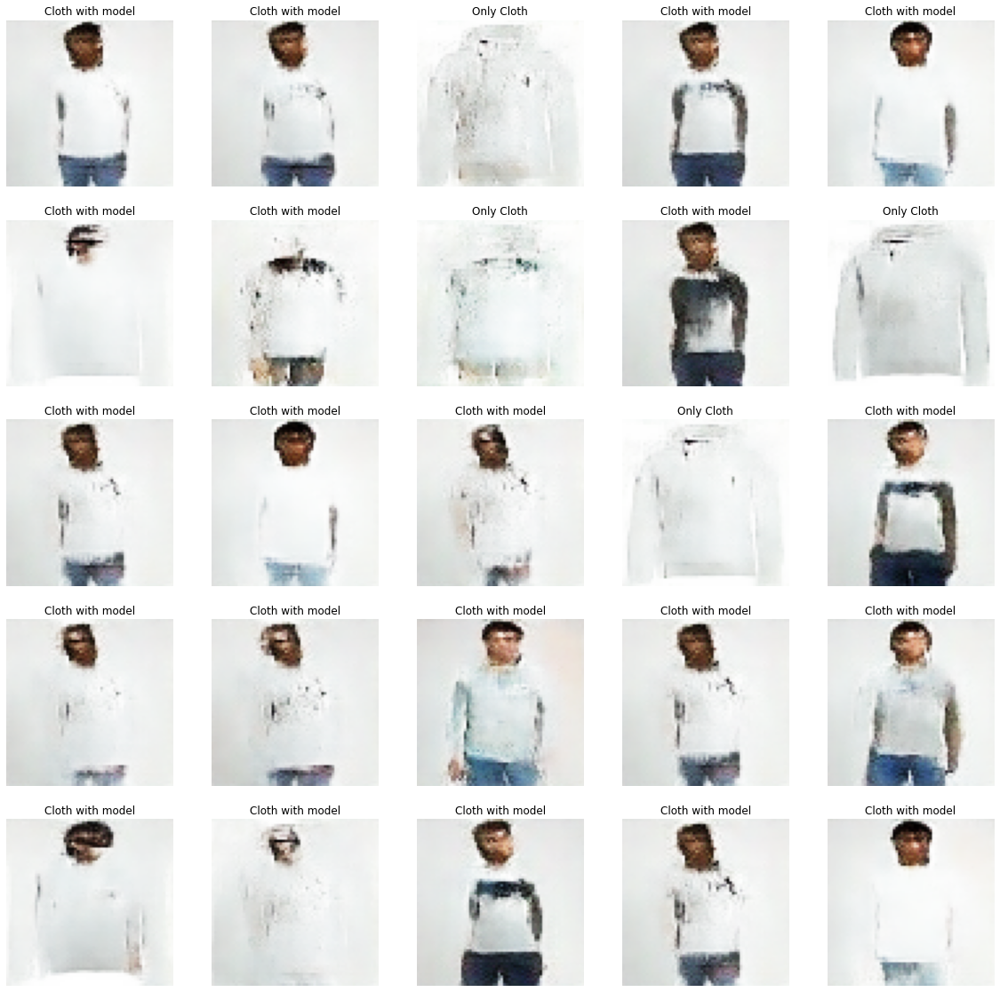

In [3]:
# Check image for different generators
seed = np.random.normal(loc = 0.5,scale = 0.9,size = (25, 3))
generated_images = unconditional_gan(seed)
label_list = []
for i in generated_images:
    prob = np.array(cloth_model_clasifier(tf.expand_dims(i, axis = 0))).tolist()[0][0]
    if prob >= 0.5:
        label_list.append('Cloth with model')
    elif prob < 0.5:
        label_list.append('Only Cloth')
    
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = 25
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(5, 5, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.title(label_list[i])
    plt.imshow(img)
    plt.axis('off')
plt.show()

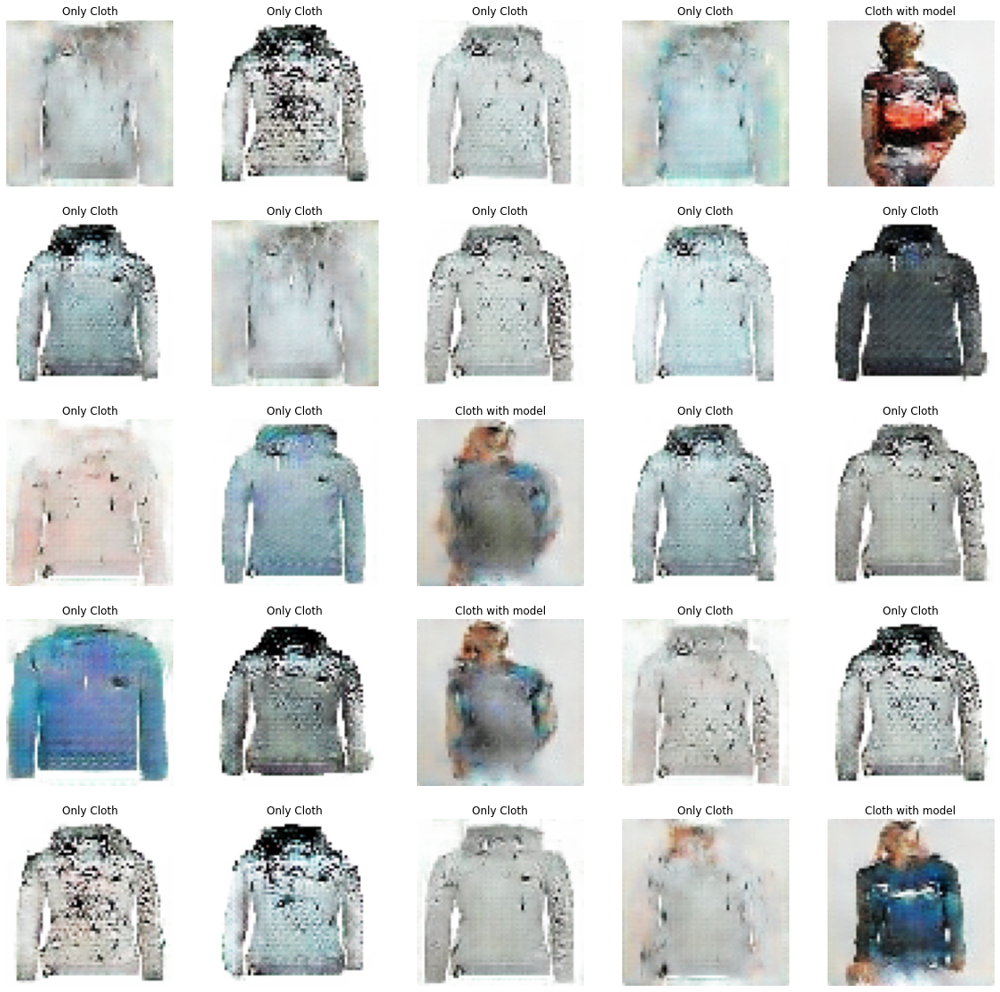

In [4]:
# Check classifier
seed = np.random.normal(loc = 0,scale = 0.4,size = (25, 3))
generated_images = conditional_gan(seed)
label_list = []
for i in generated_images:
    prob = np.array(cloth_model_clasifier(tf.expand_dims(i, axis = 0))).tolist()[0][0]
    if prob >= 0.5:
        label_list.append('Cloth with model')
    elif prob < 0.5:
        label_list.append('Only Cloth')
    
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = 25
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(5, 5, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.title(label_list[i])
    plt.imshow(img)
    plt.axis('off')
plt.show()

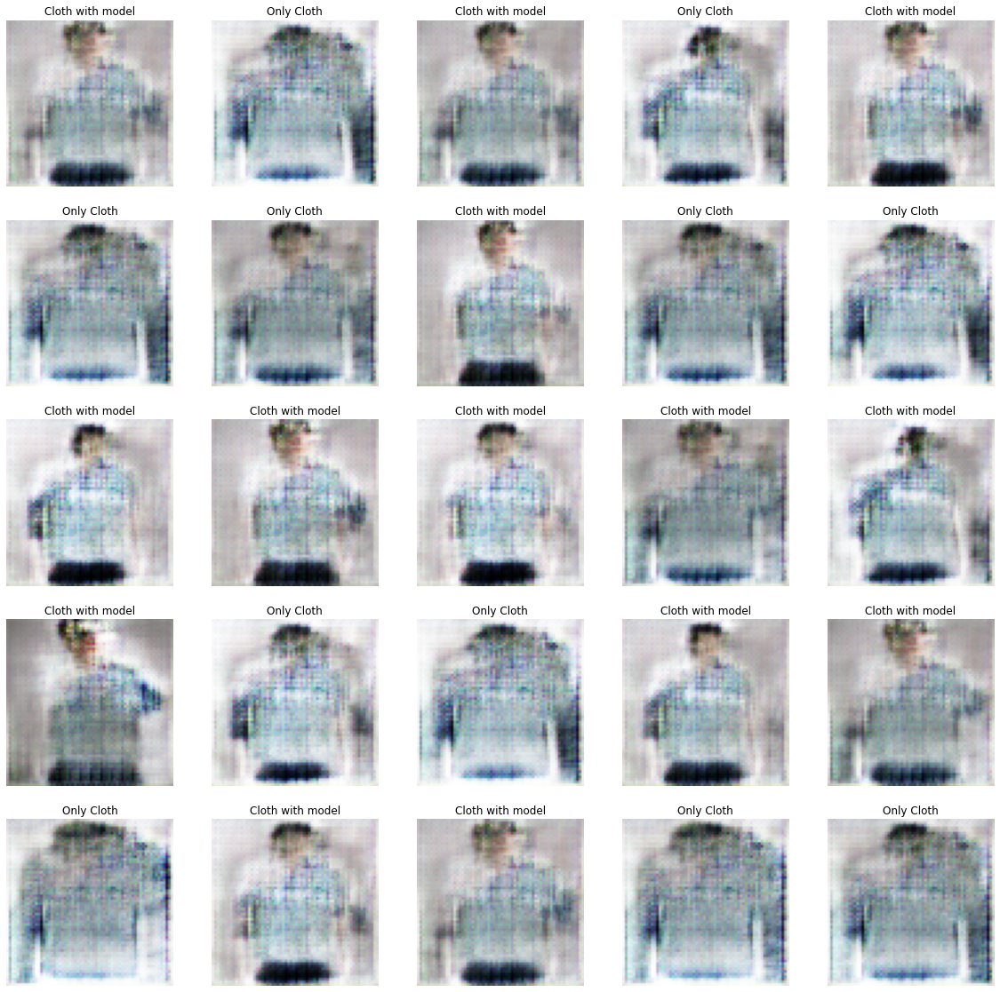

In [5]:
# Check classifier
seed = np.random.normal(loc = 0,scale = 0.2,size = (25, 3))
generated_images = conditional_softmax_gan(seed)
label_list = []
for i in generated_images:
    prob = np.array(cloth_model_clasifier(tf.expand_dims(i, axis = 0))).tolist()[0][0]
    if prob >= 0.5:
        label_list.append('Cloth with model')
    elif prob < 0.5:
        label_list.append('Only Cloth')
    
generated_images = (generated_images * 127.5) + 127.5
generated_images.numpy()
num_img = 25
fig = plt.figure(figsize=(20, 20))
for i in range(num_img):
    plt.subplot(5, 5, i+1)
    img = keras.utils.array_to_img(generated_images[i]) 
    plt.title(label_list[i])
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [6]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 0.3, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = unconditional_gan(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(cloth_model_clasifier(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Cloth with model')
    elif prob < 0.5:
        label.append('Only Cloth')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)

In [7]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 0.35, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = conditional_gan(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(cloth_model_clasifier(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Cloth with model')
    elif prob < 0.5:
        label.append('Only Cloth')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)

In [8]:
dot_num = 10000
dot_space = np.random.normal(loc = 0, scale = 0.2, size = (dot_num,3))
dot_space = pd.DataFrame(dot_space)
label = []
for i in range(dot_num):
    img = conditional_softmax_gan(tf.expand_dims(dot_space.iloc[i,:], axis = 0))
    prob = np.array(cloth_model_clasifier(img)).tolist()[0][0]
    if prob >= 0.5:
        label.append('Cloth with model')
    elif prob < 0.5:
        label.append('Only Cloth')
dot_space['label'] = pd.DataFrame(label)
px.scatter_3d(dot_space,x = 0, y = 1, z = 2, color = label)

# Calcualte metrics for different gan

In [9]:
# example of calculating the frechet inception distance in Keras for cifar10
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import shuffle
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
from keras.datasets import cifar10
import math
 
# scale an array of images to a new size
def scale_images(images, new_shape):
    images_list = list()
    for image in images:
        # resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # store
        images_list.append(new_image)
    return asarray(images_list)
 
# calculate frechet inception distance
def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    # calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    # calculate sum squared difference between means
    ssdiff = numpy.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid
def gen_fake_imgs(model, total_imgs):
    final_imgs = []
    seed = np.random.normal(loc = 0, scale = 2, size = (total_imgs,3))
    batch_size = 32
    total_batch = math.ceil(total_imgs/32)
    for batch_index in range(total_batch):
        if (batch_index+1)*batch_size < total_imgs:
            batch_seed = seed[batch_index*batch_size:(batch_index+1)*batch_size]
        else:
            batch_seed = seed[batch_index*batch_size:]
        
        gen_imgs = model(batch_seed)
        final_imgs.append(gen_imgs)
        array = np.concatenate(final_imgs, axis = 0)
        array = tf.convert_to_tensor(array)
    return array

In [10]:
# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(75,75,3))

In [11]:
path = "Z:\DataSets\Kaggle_cloth_pose"
true_images_dataset = tf.keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(64, 64), batch_size=32
)

Found 16252 files belonging to 1 classes.


In [12]:
true_images = []
for img_batch in true_images_dataset:
    true_images.append(img_batch)
true_images = tf.concat(true_images, axis = 0)
true_images = true_images[:3000]

In [13]:
unconditional_imgs = gen_fake_imgs(unconditional_gan, 3000)
conditional_imgs = gen_fake_imgs(conditional_gan, 3000)
conditional_softmax_imgs = gen_fake_imgs(conditional_softmax_gan, 3000)

In [14]:
print(true_images.shape)
print(unconditional_imgs.shape)
print(conditional_imgs.shape)
print(conditional_softmax_imgs.shape)

(3000, 64, 64, 3)
(3000, 64, 64, 3)
(3000, 64, 64, 3)
(3000, 64, 64, 3)


In [15]:
# change data float type
true_images = np.array(true_images).astype('float32')
unconditional_imgs = np.array(unconditional_imgs).astype('float32')
conditional_imgs = np.array(conditional_imgs).astype('float32')
conditional_softmax_imgs = np.array(conditional_softmax_imgs).astype('float32')

# change data scale for inception v3 model
true_images = scale_images(true_images, (75,75,3))
unconditional_imgs = scale_images(unconditional_imgs, (75,75,3))
conditional_imgs = scale_images(conditional_imgs, (75,75,3))
conditional_softmax_imgs = scale_images(conditional_softmax_imgs, (75,75,3))

In [16]:
print(true_images.shape)
print(unconditional_imgs.shape)
print(conditional_imgs.shape)
print(conditional_softmax_imgs.shape)

(3000, 75, 75, 3)
(3000, 75, 75, 3)
(3000, 75, 75, 3)
(3000, 75, 75, 3)


In [17]:
true_images = preprocess_input(true_images)
unconditional_imgs = preprocess_input(unconditional_imgs)
conditional_imgs = preprocess_input(conditional_imgs)
conditional_softmax_imgs = preprocess_input(conditional_softmax_imgs)

In [18]:
print(true_images.dtype)
print(unconditional_imgs.dtype)
print(conditional_imgs.dtype)
print(conditional_softmax_imgs.dtype)

float32
float32
float32
float32


In [19]:
fid_unconditional = calculate_fid(model, true_images, unconditional_imgs)
print('FID: %.3f' % fid_unconditional)

FID: 2291.102


In [20]:
fid_conditional = calculate_fid(model, true_images, conditional_imgs)
print('FID: %.3f' % fid_conditional)

FID: 2077.153


In [21]:
fid_conditional_softmax = calculate_fid(model, true_images, conditional_softmax_imgs)
print('FID: %.3f' % fid_conditional_softmax)

FID: 2497.258


In [22]:
fid_uncon_con = calculate_fid(model, unconditional_imgs, conditional_imgs)
print('FID: %.3f' % fid_uncon_con)

FID: 238.173


In [23]:
fid_uncon_softmax = calculate_fid(model, unconditional_imgs, conditional_softmax_imgs)
print('FID: %.3f' % fid_uncon_softmax)

FID: 156.697


In [24]:
fid_con_softmax = calculate_fid(model, conditional_imgs, conditional_softmax_imgs)
print('FID: %.3f' % fid_con_softmax)

FID: 485.395
